In [38]:
%matplotlib inline
%reload_ext autoreload
%autoreload 2

In [39]:
from typing import *
import numpy as np
from functools import partial
from fastprogress import progress_bar
import pandas as pd
import h5py

from lumin.plotting.results import plot_roc

import torch
from torch import Tensor, nn
import torch.nn.functional as F
from torch._vmap_internals import _vmap as vmap

from tomopt.volume import *
from tomopt.muon import *
from tomopt.inference import *
from tomopt.optimisation import *
from tomopt.core import *
from tomopt.utils import *
from tomopt.plotting import *

import seaborn as sns
import matplotlib.pyplot as plt

In [132]:
df = pd.read_csv('z_sep_data.csv')

In [133]:
df

,az0,az1,az2,az3,bz0,bz1,bz2,bz3,auc,auc_unc
0,0.914012,0.877306,0.825831,0.805421,0.132964,0.107893,0.076997,0.018282,0.922617,0.020164
1,0.944217,0.922763,0.887347,0.835888,0.151046,0.113089,0.060073,0.005641,0.881782,0.023326
2,0.973404,0.906292,0.851596,0.829492,0.145443,0.089395,0.087707,0.034052,0.917431,0.019655
3,0.960263,0.861912,0.858426,0.838359,0.164943,0.141219,0.053146,0.010399,0.909469,0.021475
4,0.953248,0.952990,0.938438,0.904456,0.113036,0.078161,0.070929,0.027537,0.895464,0.022554
...,...,...,...,...,...,...,...,...,...,...
445,0.893151,0.877606,0.855265,0.843976,0.127677,0.030037,0.028675,0.004430,0.935859,0.017659
446,0.958221,0.927571,0.879100,0.870160,0.160257,0.127979,0.059070,0.029672,0.885195,0.023082
447,0.958787,0.884533,0.873391,0.867100,0.183160,0.077336,0.007078,0.006845,0.922029,0.018496
448,0.984093,0.964606,0.935248,0.825166,0.166229,0.151129,0.105423,0.029118,0.893990,0.023395


In [42]:
from skopt.space import Real, Integer, Categorical
from skopt.utils import use_named_args
from skopt import gp_minimize, Optimizer
from skopt.plots import plot_evaluations, plot_objective

In [43]:
det_pars = [f for f in df.columns if 'z' in f]

In [44]:
space  = [Real(df[f].min(), df[f].max(), name=f) for f in det_pars]

In [75]:
opt = gp_minimize(lambda x: 0, space, n_random_starts=0, x0=df[det_pars].values.tolist(), y0=-df.auc, n_calls=0, verbose=1, random_state=0);

Iteration No: 1 started. Evaluating function at random point.
Iteration No: 1 ended. Evaluation done at random point.
Time taken: 25.6302
Function value obtained: -0.8578
Current minimum: -0.9482


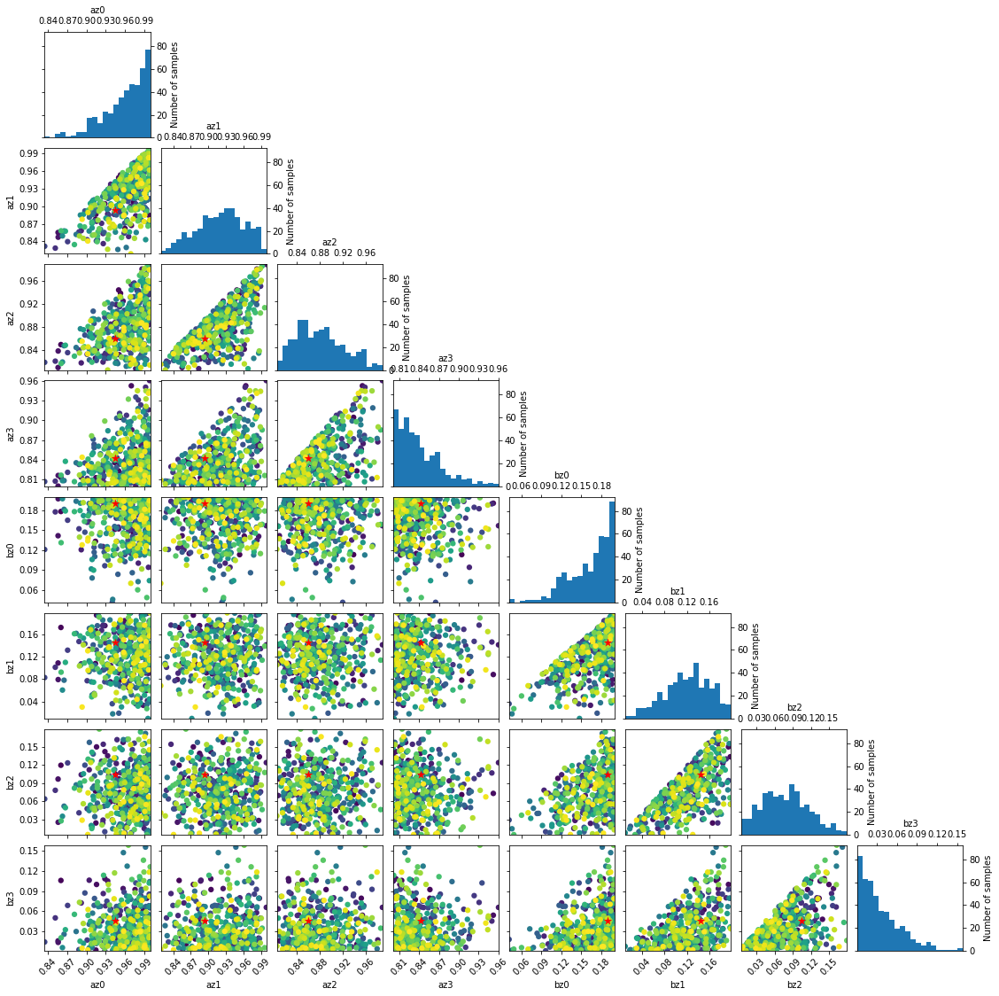

In [47]:
_ = plot_evaluations(opt, dimensions=det_pars)

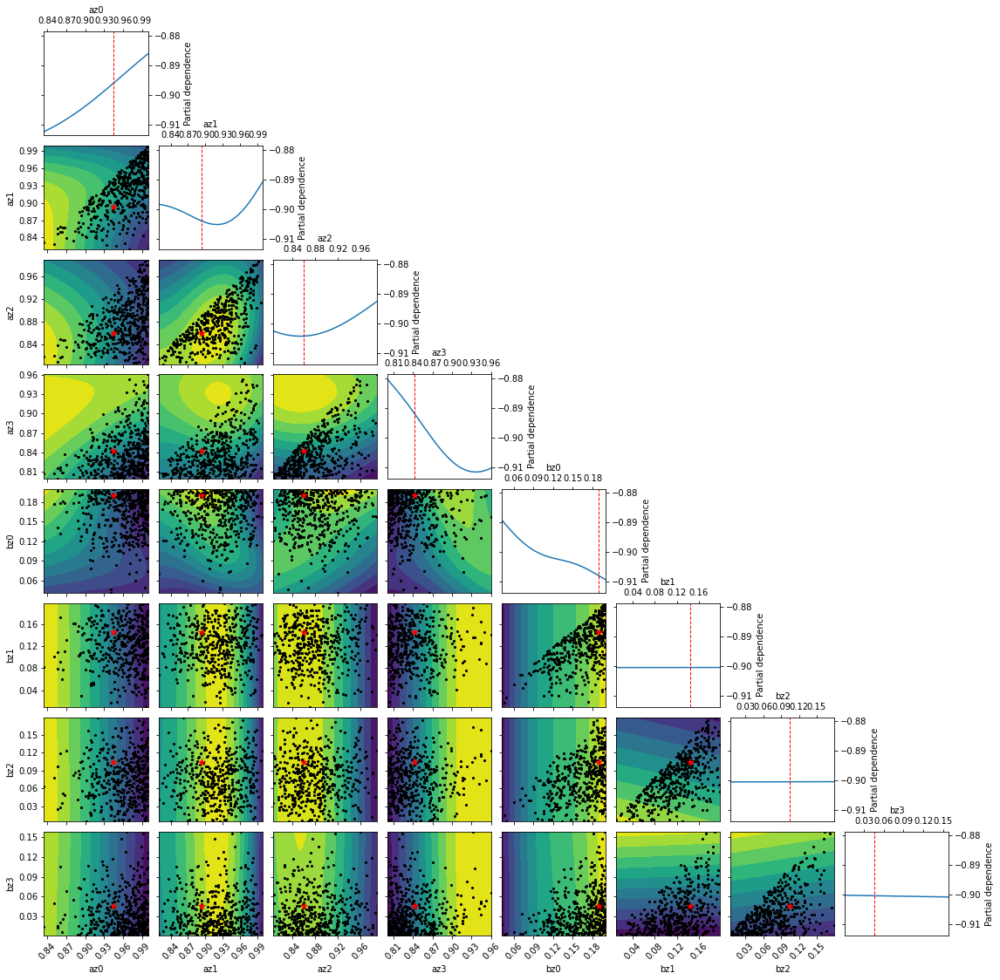

In [76]:
_ = plot_objective(opt, dimensions=det_pars)

## Extra feats

In [49]:
above_z = [f for f in det_pars if 'az' in f]
below_z = [f for f in det_pars if 'bz' in f]

In [56]:
df['mean_z_above'] = np.mean(df[above_z].values, axis=-1)
df['mean_z_below'] = np.mean(df[below_z].values, axis=-1)

In [58]:
df['std_z_above'] = np.std(df[above_z].values, axis=-1)
df['std_z_below'] = np.std(df[below_z].values, axis=-1)

In [62]:
df['central_seperation'] = df.mean_z_above-df.mean_z_below
df['max_seperation'] = df.az0-df.bz3

In [64]:
df['z_width_above'] = df.az0-df.az3
df['z_width_below'] = df.bz0-df.bz3

In [65]:
df['az01_sep'] = df.az0-df.az1
df['az12_sep'] = df.az1-df.az2
df['az23_sep'] = df.az2-df.az3

In [66]:
df['bz01_sep'] = df.bz0-df.bz1
df['bz12_sep'] = df.bz1-df.bz2
df['bz23_sep'] = df.bz2-df.bz3

In [68]:
df['az01_az23_centre_sep'] = np.mean(df[['az0', 'az1']].values, axis=-1)-np.mean(df[['az2', 'az3']].values, axis=-1)
df['bz01_bz23_centre_sep'] = np.mean(df[['bz0', 'bz1']].values, axis=-1)-np.mean(df[['bz2', 'bz3']].values, axis=-1)

In [69]:
df

,az0,az1,az2,az3,bz0,bz1,bz2,bz3,auc,unc,...,z_width_above,z_width_below,az01_sep,az12_sep,az23_sep,bz01_sep,bz12_sep,bz23_sep,az01_az23_centre_sep,bz01_bz23_centre_sep
0,0.914012,0.877306,0.825831,0.805421,0.132964,0.107893,0.076997,0.018282,0.922617,0.020164,...,0.108591,0.114683,0.036706,0.051476,0.020409,0.025071,0.030896,0.058716,0.080033,0.072789
0,0.944217,0.922763,0.887347,0.835888,0.151046,0.113089,0.060073,0.005641,0.881782,0.023326,...,0.108329,0.145406,0.021455,0.035416,0.051459,0.037957,0.053016,0.054433,0.071873,0.099211
0,0.973404,0.906292,0.851596,0.829492,0.145443,0.089395,0.087707,0.034052,0.917431,0.019655,...,0.143912,0.111390,0.067112,0.054696,0.022104,0.056048,0.001688,0.053655,0.099304,0.056539
0,0.960263,0.861912,0.858426,0.838359,0.164943,0.141219,0.053146,0.010399,0.909469,0.021475,...,0.121904,0.154543,0.098352,0.003486,0.020067,0.023724,0.088073,0.042747,0.062695,0.121308
0,0.953248,0.952990,0.938438,0.904456,0.113036,0.078161,0.070929,0.027537,0.895464,0.022554,...,0.048793,0.085499,0.000258,0.014552,0.033982,0.034874,0.007232,0.043392,0.031672,0.046365
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
0,0.893151,0.877606,0.855265,0.843976,0.127677,0.030037,0.028675,0.004430,0.935859,0.017659,...,0.049175,0.123246,0.015545,0.022341,0.011289,0.097639,0.001362,0.024245,0.035758,0.062304
0,0.958221,0.927571,0.879100,0.870160,0.160257,0.127979,0.059070,0.029672,0.885195,0.023082,...,0.088061,0.130585,0.030650,0.048471,0.008940,0.032278,0.068909,0.029398,0.068266,0.099747
0,0.958787,0.884533,0.873391,0.867100,0.183160,0.077336,0.007078,0.006845,0.922029,0.018496,...,0.091687,0.176315,0.074254,0.011142,0.006291,0.105824,0.070259,0.000233,0.051414,0.123287
0,0.984093,0.964606,0.935248,0.825166,0.166229,0.151129,0.105423,0.029118,0.893990,0.023395,...,0.158928,0.137111,0.019488,0.029358,0.110082,0.015100,0.045707,0.076304,0.094143,0.091409


In [70]:
extra_feats = [f for f in df.columns if f not in ['auc', 'unc']+det_pars]

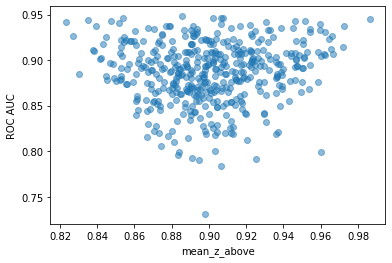

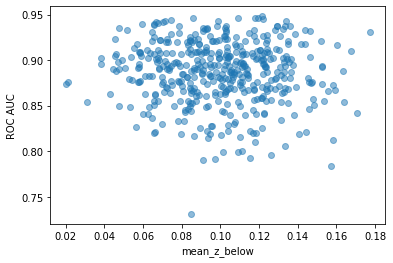

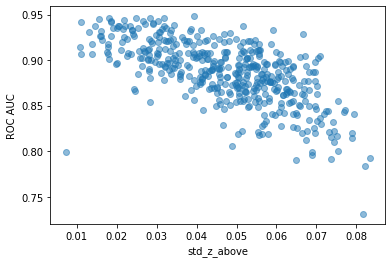

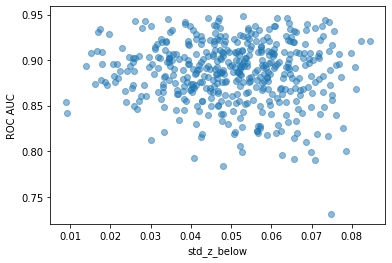

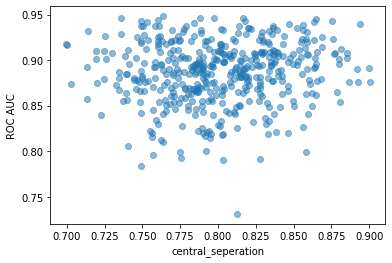

...

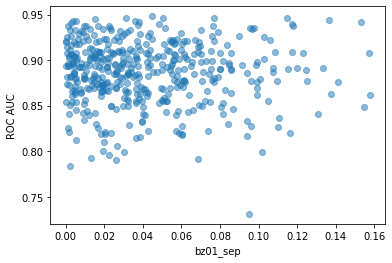

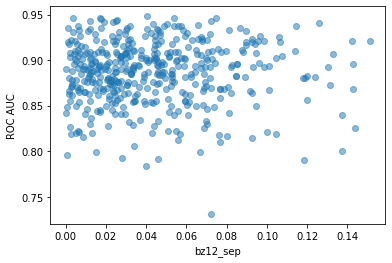

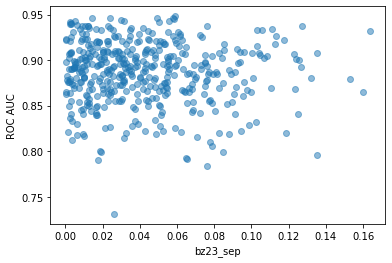

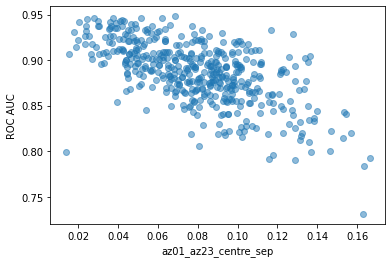

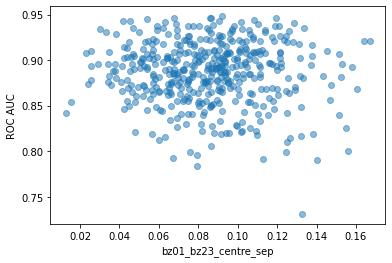

In [73]:
for f in extra_feats:
    plt.scatter(df[f], df.auc, alpha=0.5)
    plt.xlabel(f)
    plt.ylabel('ROC AUC')
    plt.show()

In [74]:
check_feats = ['az01_az23_centre_sep', 'z_width_above', 'std_z_above']

In [83]:
check_opt = gp_minimize(lambda x: 0, [Real(df[f].min(), df[f].max(), name=f) for f in extra_feats], n_random_starts=0, x0=df[extra_feats].values.tolist(), y0=-df.auc, n_calls=0, verbose=1, random_state=0);

Iteration No: 1 started. Evaluating function at random point.
Iteration No: 1 ended. Evaluation done at random point.
Time taken: 42.6237
Function value obtained: -0.8578
Current minimum: -0.9482


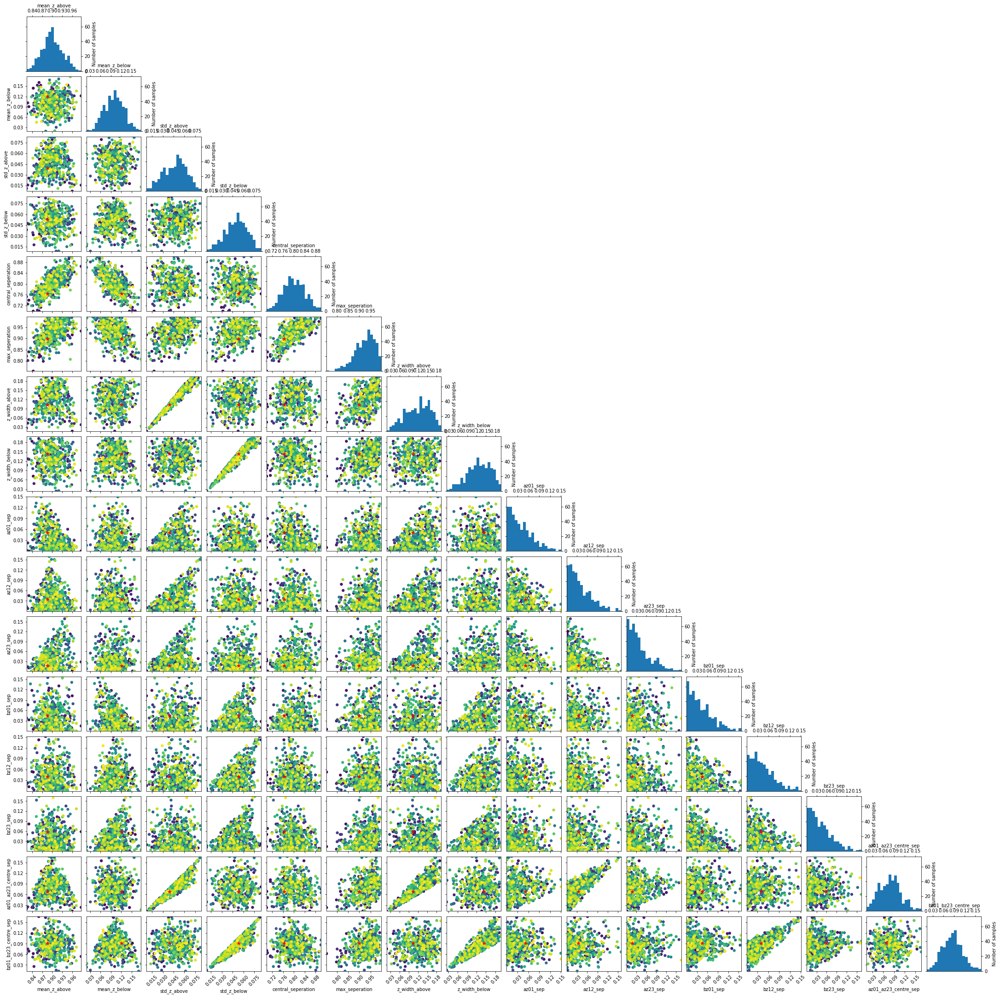

In [84]:
_ = plot_evaluations(check_opt, dimensions=extra_feats)

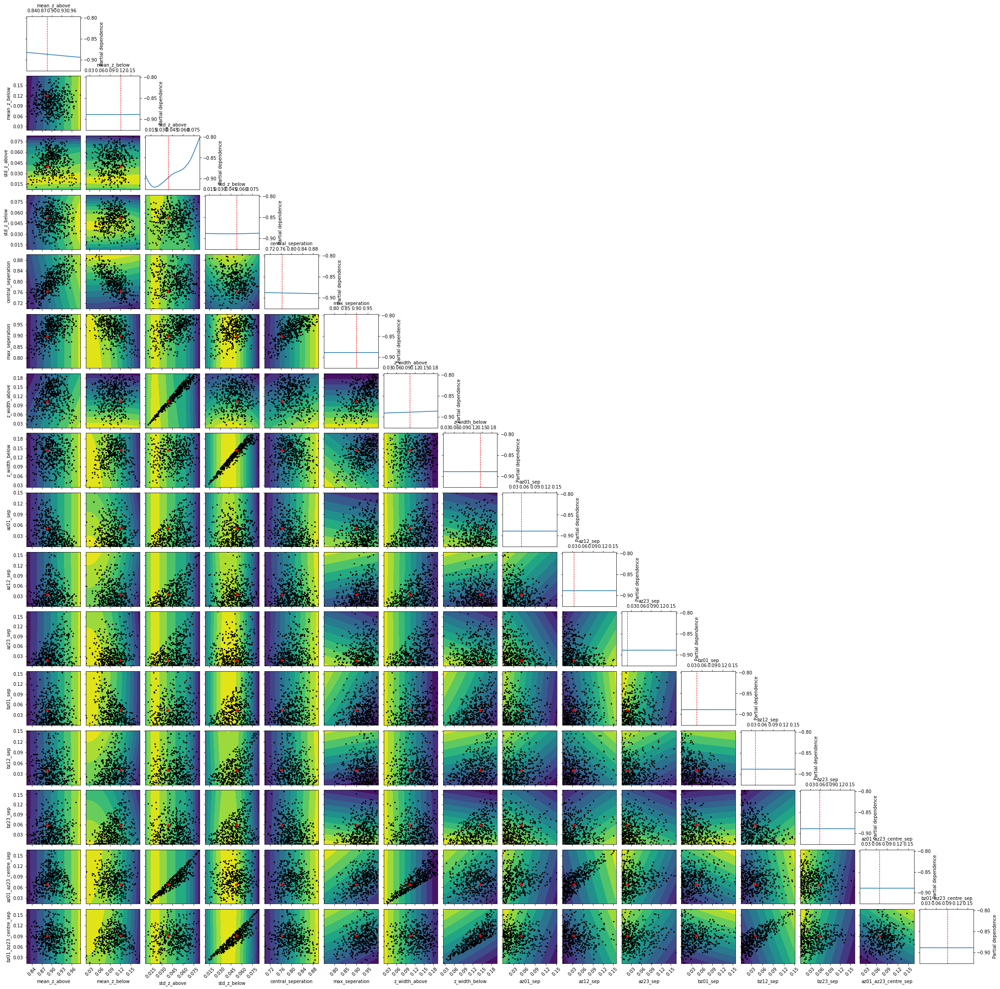

In [85]:
_ = plot_objective(check_opt, dimensions=extra_feats)

## RF on det pars

In [99]:
from sklearn.model_selection import train_test_split

trn_idxs, val_idxs = train_test_split(df.index, test_size=0.2, random_state=1111)
len(df.loc[trn_idxs]), len(df.loc[val_idxs])

(360, 90)

In [106]:
from lumin.optimisation.hyper_param import get_opt_rf_params
from collections import OrderedDict

rf_params, rf = get_opt_rf_params(x_trn=df[det_pars], y_trn=df['auc'],
                                 x_val=df[det_pars], y_val=df['auc'],
                                 objective='regression',
                                 n_estimators=100, verbose=False,
                                 params=OrderedDict({'min_samples_leaf': [2,4,8,16,32],
                                                     'max_features': [0.3,0.5,0.7,0.9]}))

In [107]:
rf

RandomForestRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mse',
                      max_depth=None, max_features=0.9, max_leaf_nodes=None,
                      max_samples=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=2,
                      min_samples_split=2, min_weight_fraction_leaf=0.0,
                      n_estimators=100, n_jobs=-1, oob_score=False,
                      random_state=None, verbose=0, warm_start=False)

In [108]:
from lumin.plotting.interpretation import plot_1d_partial_dependence, plot_2d_partial_dependence

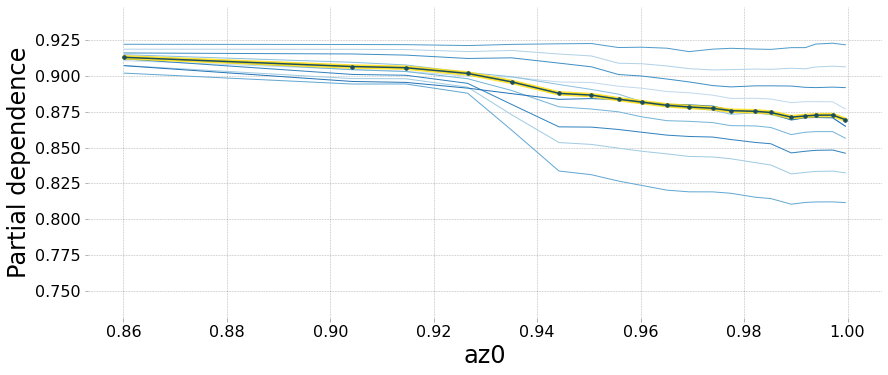

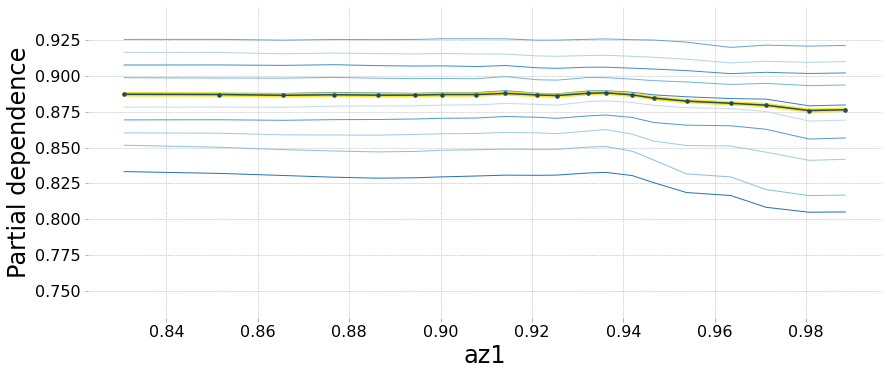

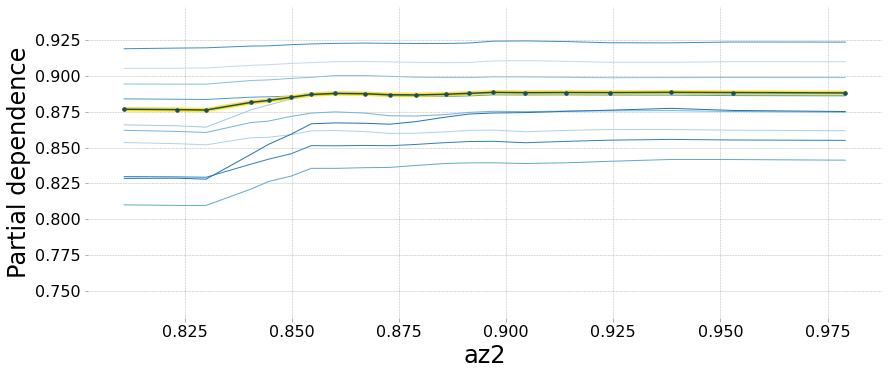

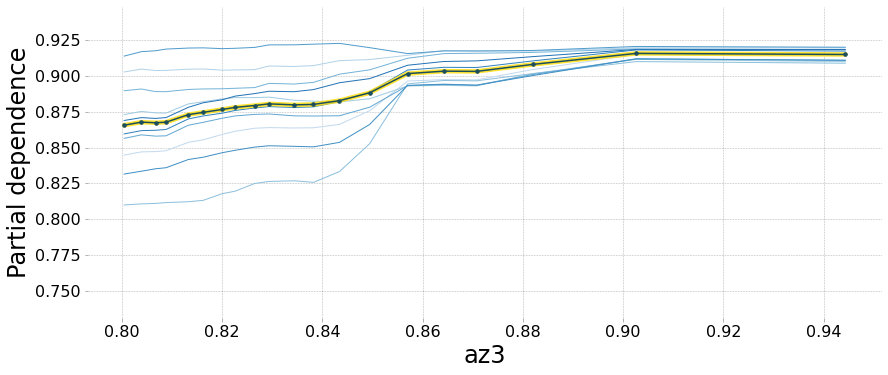

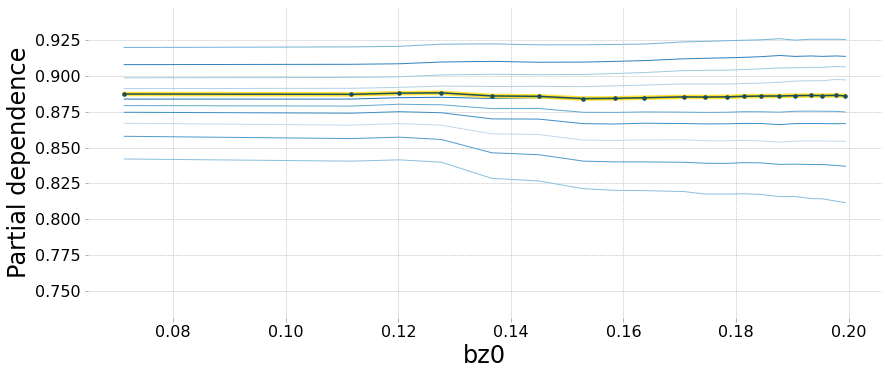

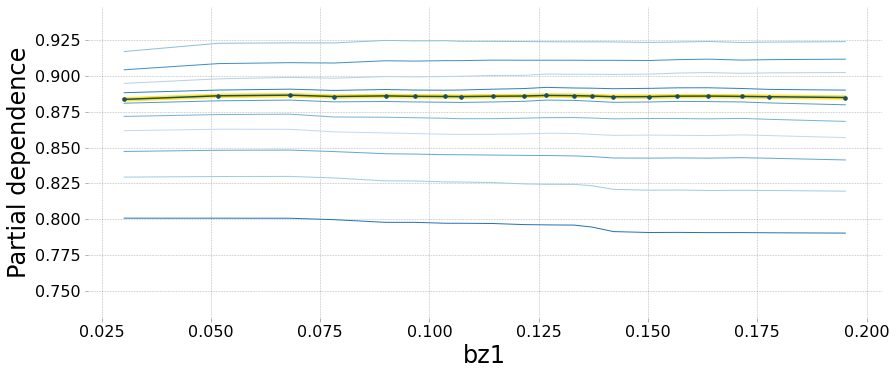

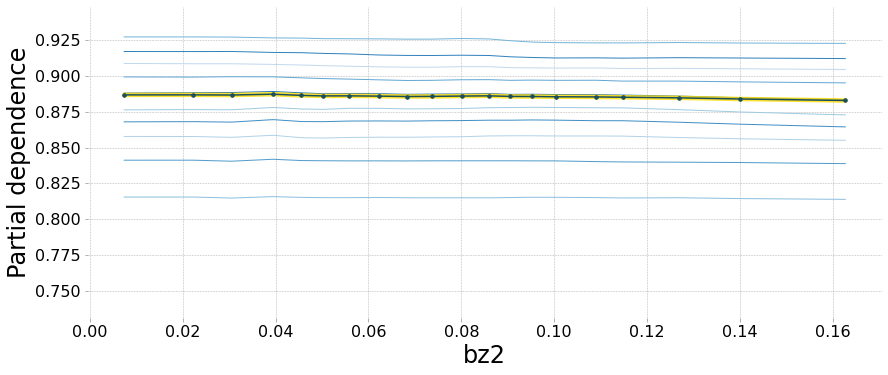

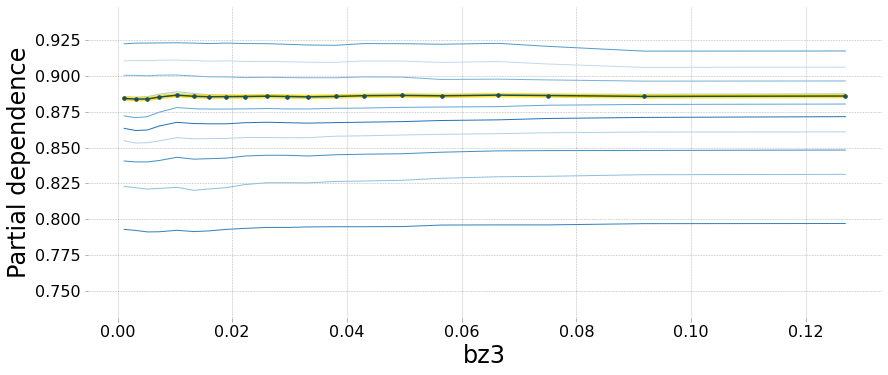

In [111]:
for f in det_pars:
    plot_1d_partial_dependence(rf, df=df, feat=f, train_feats=det_pars, pdp_isolate_kargs={'percentile_range':(1,99)}, y_lim=(df.auc.min(), df.auc.max()))

## RF on extra feats

In [113]:
from lumin.optimisation.hyper_param import get_opt_rf_params
from collections import OrderedDict

rf_params, rf = get_opt_rf_params(x_trn=df[extra_feats], y_trn=df['auc'],
                                 x_val=df[extra_feats], y_val=df['auc'],
                                 objective='regression',
                                 n_estimators=100, verbose=False,
                                 params=OrderedDict({'min_samples_leaf': [2,4,8,16,32],
                                                     'max_features': [0.3,0.5,0.7,0.9]}))

In [114]:
rf

RandomForestRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mse',
                      max_depth=None, max_features=0.5, max_leaf_nodes=None,
                      max_samples=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=2,
                      min_samples_split=2, min_weight_fraction_leaf=0.0,
                      n_estimators=100, n_jobs=-1, oob_score=False,
                      random_state=None, verbose=0, warm_start=False)

In [115]:
from lumin.plotting.interpretation import plot_1d_partial_dependence, plot_2d_partial_dependence

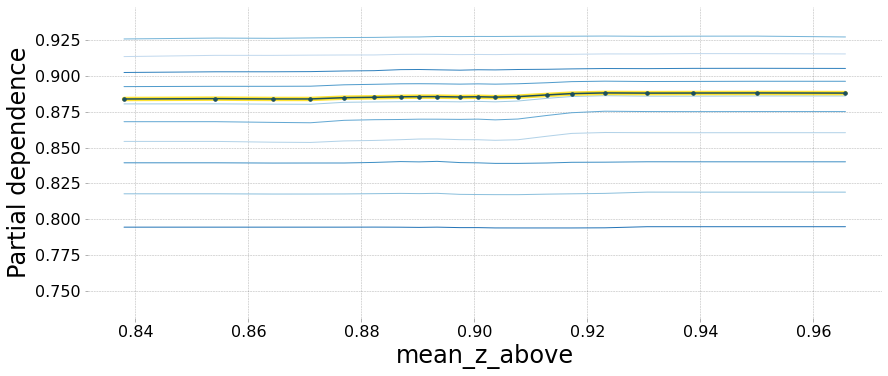

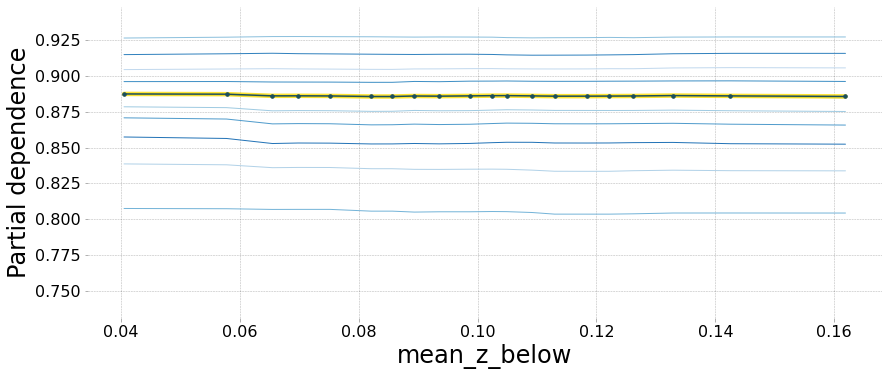

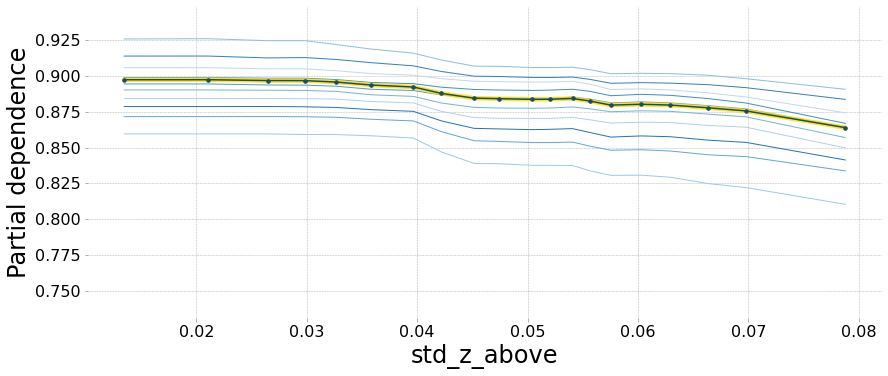

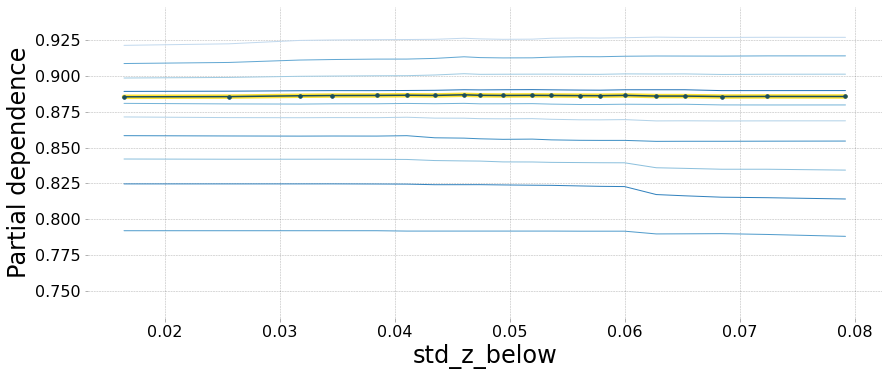

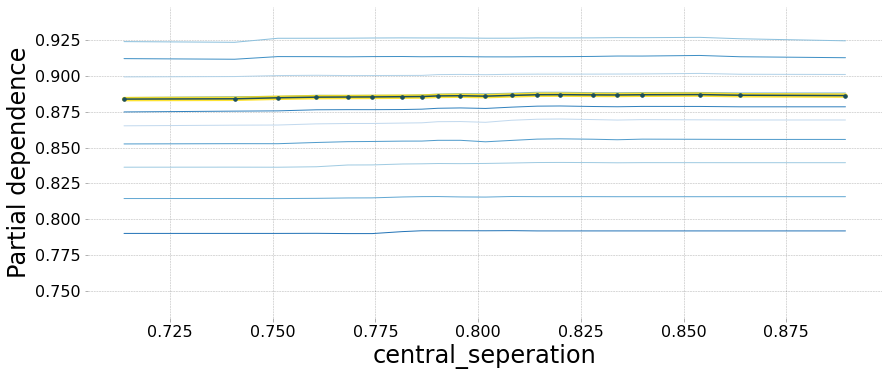

...

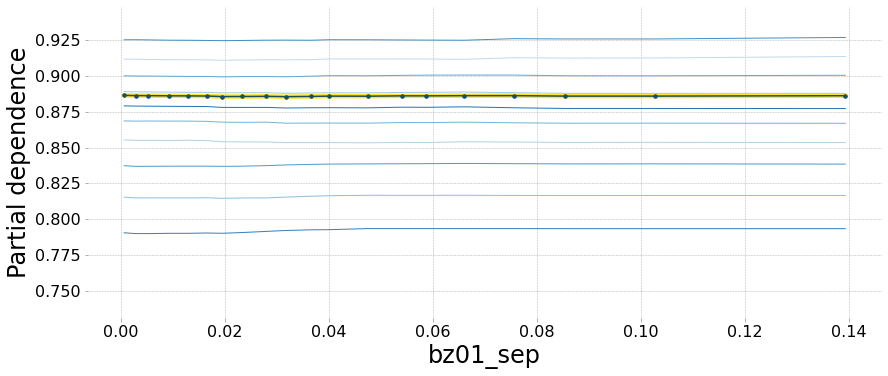

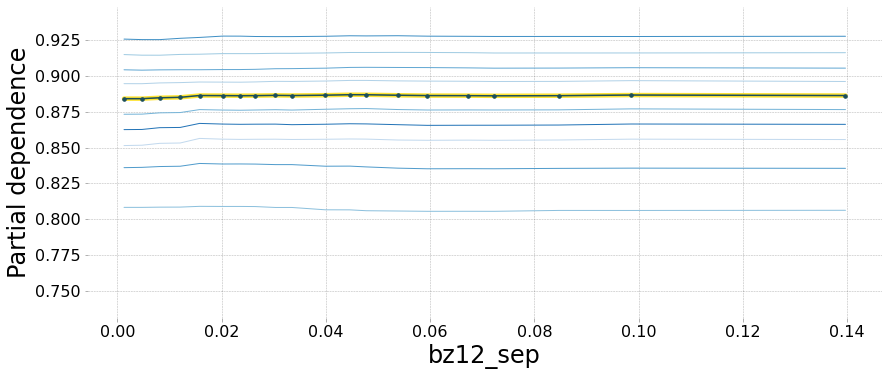

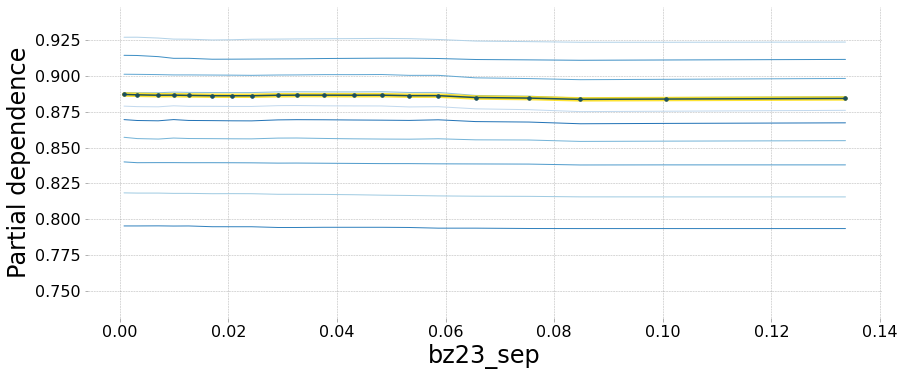

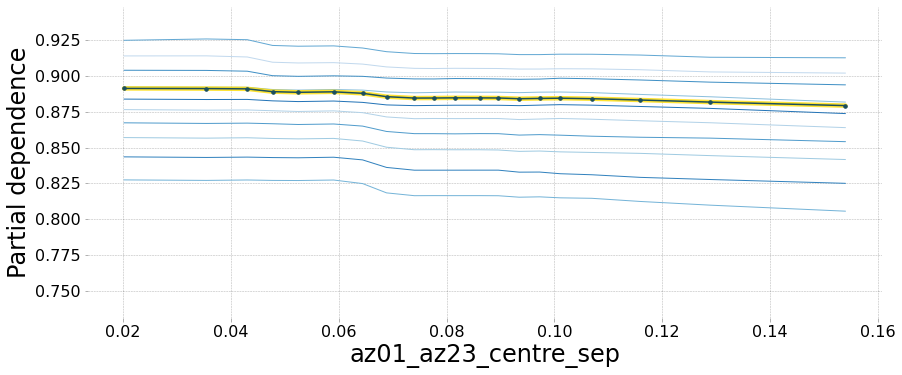

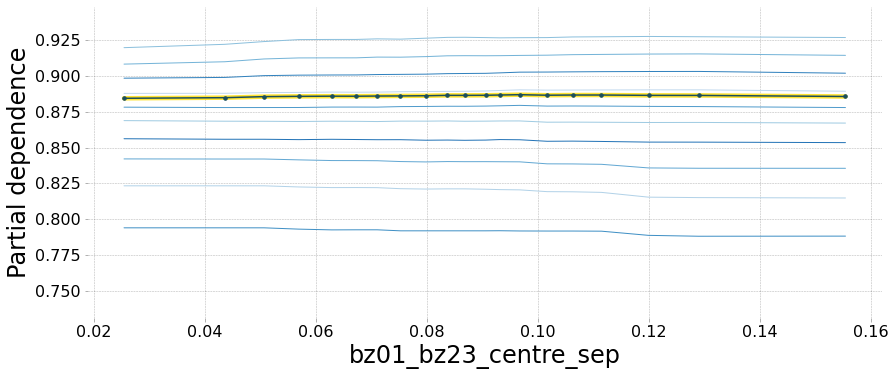

In [117]:
for f in extra_feats:
    plot_1d_partial_dependence(rf, df=df, feat=f, train_feats=extra_feats, pdp_isolate_kargs={'percentile_range':(1,99)}, y_lim=(df.auc.min(), df.auc.max()))

## RF on selected feats

In [119]:
all_feats = det_pars+extra_feats

In [120]:
from lumin.optimisation.hyper_param import get_opt_rf_params
from collections import OrderedDict

rf_params, rf = get_opt_rf_params(x_trn=df[all_feats], y_trn=df['auc'],
                                 x_val=df[all_feats], y_val=df['auc'],
                                 objective='regression',
                                 n_estimators=100, verbose=False,
                                 params=OrderedDict({'min_samples_leaf': [2,4,8,16,32],
                                                     'max_features': [0.3,0.5,0.7,0.9]}))

In [114]:
rf

RandomForestRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mse',
                      max_depth=None, max_features=0.5, max_leaf_nodes=None,
                      max_samples=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=2,
                      min_samples_split=2, min_weight_fraction_leaf=0.0,
                      n_estimators=100, n_jobs=-1, oob_score=False,
                      random_state=None, verbose=0, warm_start=False)

Computing Spearman's rank-order correlation coefficients


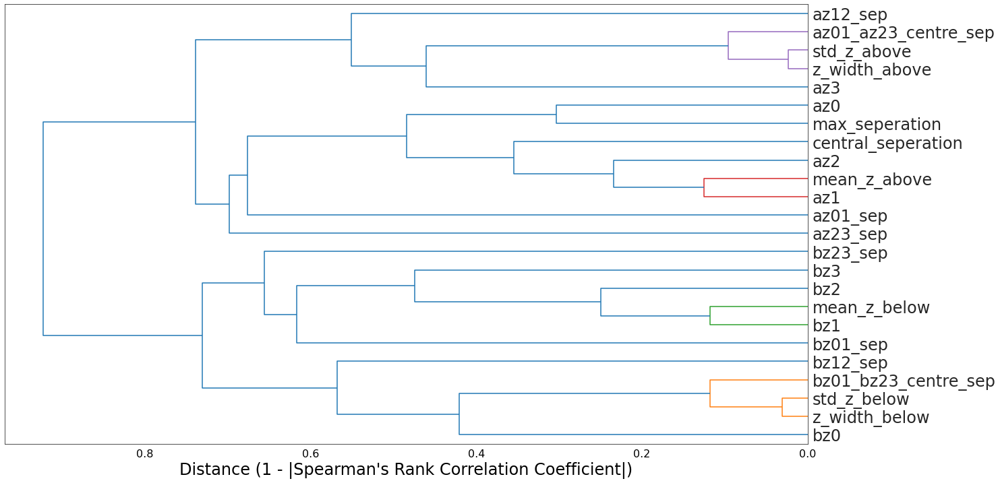

4 sets of features found to pass correlation threshold of 0.8:
[['z_width_above', 'std_z_above', 'az01_az23_centre_sep'], ['bz1', 'mean_z_below'], ['z_width_below', 'std_z_below', 'bz01_bz23_centre_sep'], ['az1', 'mean_z_above']]



Checking set: ['z_width_above', 'std_z_above', 'az01_az23_centre_sep']
+----------------------+-------------+-------------+
|       Removed        |  OOB Score  |  Val Score  |
+----------------------+-------------+-------------+
|         None         | 0.411±0.005 | 0.883±0.001 |
|    z_width_above     | 0.423±0.004 | 0.883±0.001 |
|     std_z_above      | 0.415±0.007 | 0.884±0.002 |
| az01_az23_centre_sep | 0.413±0.003 | 0.883±0.001 |
+----------------------+-------------+-------------+
Dropping std_z_above

Checking set: ['z_width_above', 'az01_az23_centre_sep']
+----------------------+-------------+-------------+
|       Removed        |  OOB Score  |  Val Score  |
+----------------------+-------------+-------------+
|         None         | 0.408±0.007 | 0.878±0.002 |
|    z_width_above     | 0.406±0.002 | 0.883±0.002 |
| az01_az23_centre_sep | 0.411±0.009 | 0.882±0.002 |
+----------------------+-------------+-------------+
Dropping z_width_above

Checking set: ['bz1', 'mean_z_b

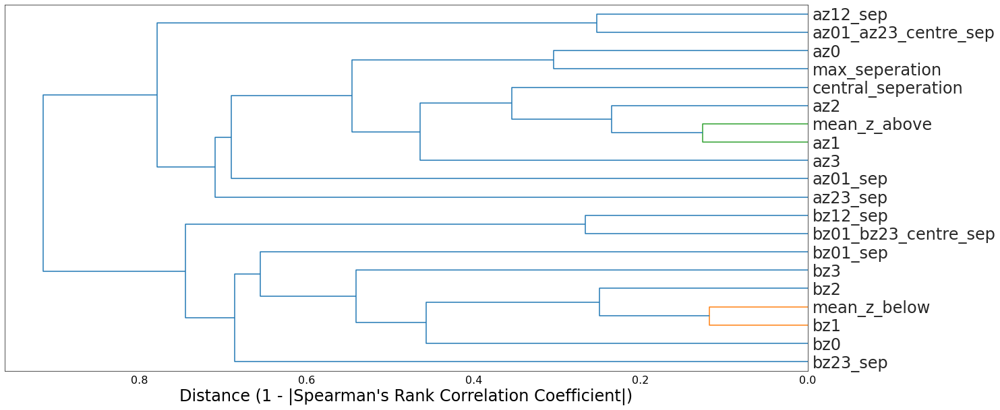

2 sets of features still found to pass correlation threshold of 0.8.

Comparing RF scores, higher = better
All features:		0.884±0.003
Filtered features:	0.882±0.002

Filtering took 9.298 seconds


In [121]:
from lumin.optimisation.features import auto_filter_on_linear_correlation

filtered_feats = auto_filter_on_linear_correlation(train_df=df, val_df=df,
                                                   check_feats=all_feats, n_rfs=5,
                                                   corr_threshold=0.8, rf_params=rf_params, optimise_rf=False,
                                                   objective='regression', targ_name='auc')

Optimising RF parameters


Evaluating importances


Top ten most important features:
                  Feature  Importance
0   az01_az23_centre_sep    0.590618
1                    az3    0.197929
2                    az0    0.098431
3               az12_sep    0.071835
4               az01_sep    0.060132
5                    bz0    0.045478
6   bz01_bz23_centre_sep    0.041929
8               bz12_sep    0.032967
7               az23_sep    0.032592
10                   az1    0.028071


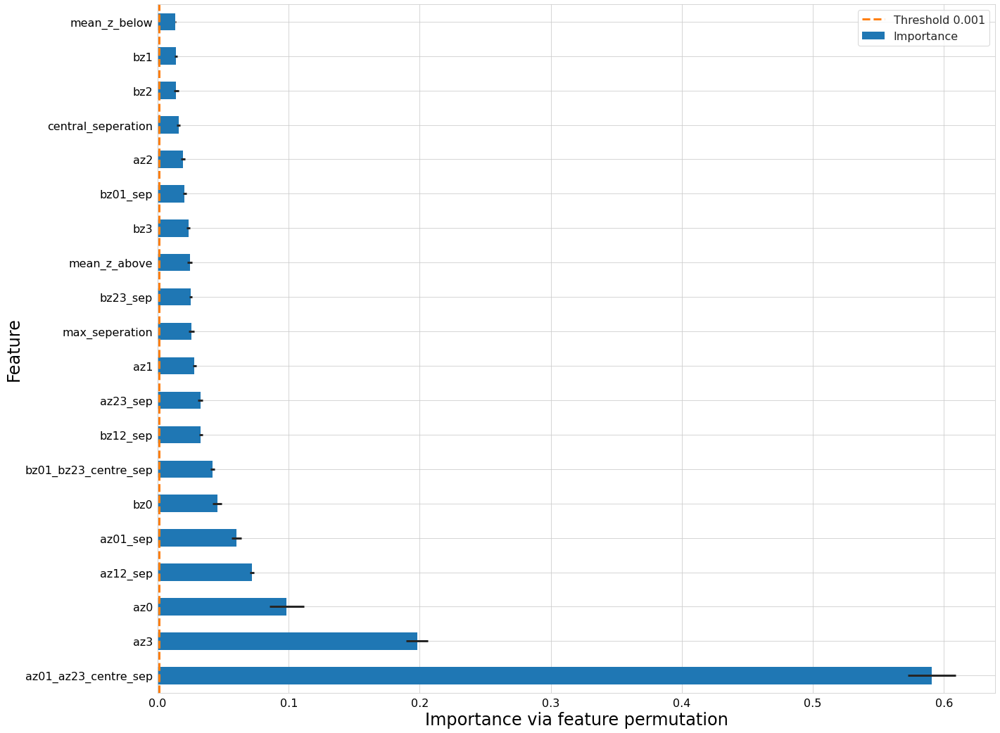


20 features found with importance greater than 0.001:
 ['az01_az23_centre_sep', 'az3', 'az0', 'az12_sep', 'az01_sep', 'bz0', 'bz01_bz23_centre_sep', 'bz12_sep', 'az23_sep', 'az1', 'max_seperation', 'bz23_sep', 'mean_z_above', 'bz3', 'bz01_sep', 'az2', 'central_seperation', 'bz2', 'bz1', 'mean_z_below'] 

All training features found to be important


In [122]:
from lumin.optimisation.features import rf_rank_features

_ = rf_rank_features(train_df=df, val_df=df, objective='regression',
                     train_feats=filtered_feats, targ_name='auc',
                     importance_cut=0.001,
                     rf_params=OrderedDict({'min_samples_leaf': [2,4,8,16,32],
                                            'max_features': [0.3,0.5,0.7,0.9]}), n_rfs=5, optimise_rf=True)

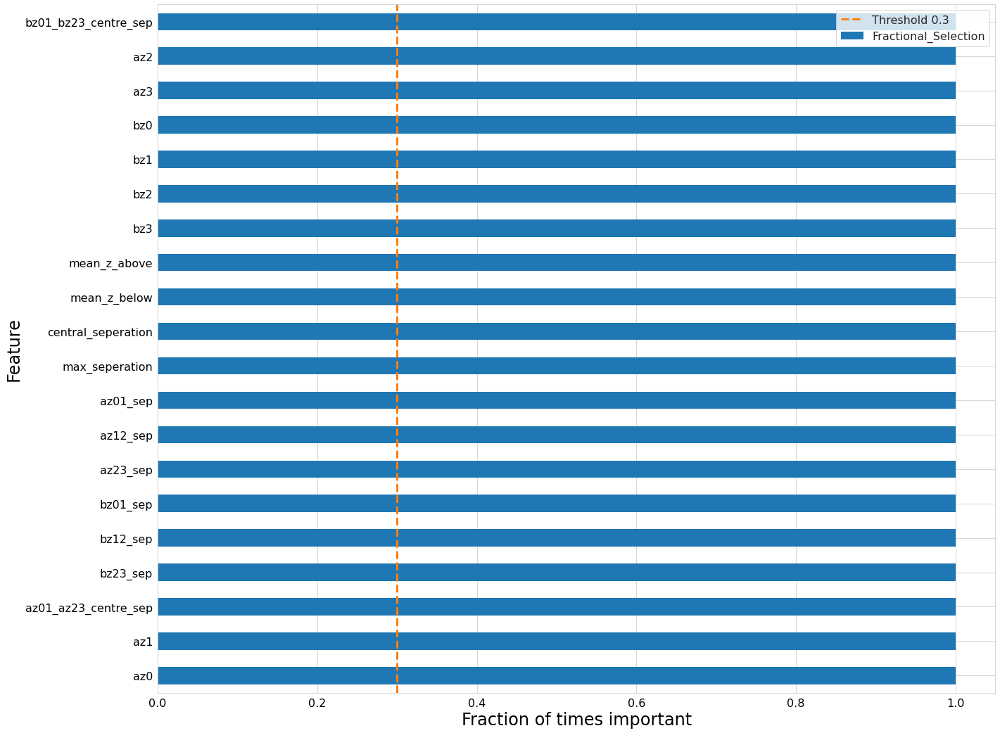


20 features found with fractional selection greater than 0.3:
 ['az0', 'az1', 'az01_az23_centre_sep', 'bz23_sep', 'bz12_sep', 'bz01_sep', 'az23_sep', 'az12_sep', 'az01_sep', 'max_seperation', 'central_seperation', 'mean_z_below', 'mean_z_above', 'bz3', 'bz2', 'bz1', 'bz0', 'az3', 'az2', 'bz01_bz23_centre_sep'] 

All training features found to be important


In [124]:
from lumin.optimisation.features import repeated_rf_rank_features

import_feats, fi = repeated_rf_rank_features(train_df=df, val_df=df, targ_name='auc',
                                             n_reps=10, min_frac_import=0.3,
                                             rf_params=OrderedDict({'min_samples_leaf': [2,4,8,16,32],
                                                                    'max_features': [0.3,0.5,0.7,0.9]}),
                                             objective='regression', resample_val=True,
                                             train_feats=filtered_feats, importance_cut=0.001,
                                             n_rfs=5, n_threads=5)

In [126]:
rf_params, rf = get_opt_rf_params(x_trn=df[import_feats], y_trn=df['auc'],
                                 x_val=df[import_feats], y_val=df['auc'],
                                 objective='regression',
                                 n_estimators=100, verbose=False,
                                 params=OrderedDict({'min_samples_leaf': [2,4,8,16,32],
                                                     'max_features': [0.3,0.5,0.7,0.9]}))

Computing mutual dependencies


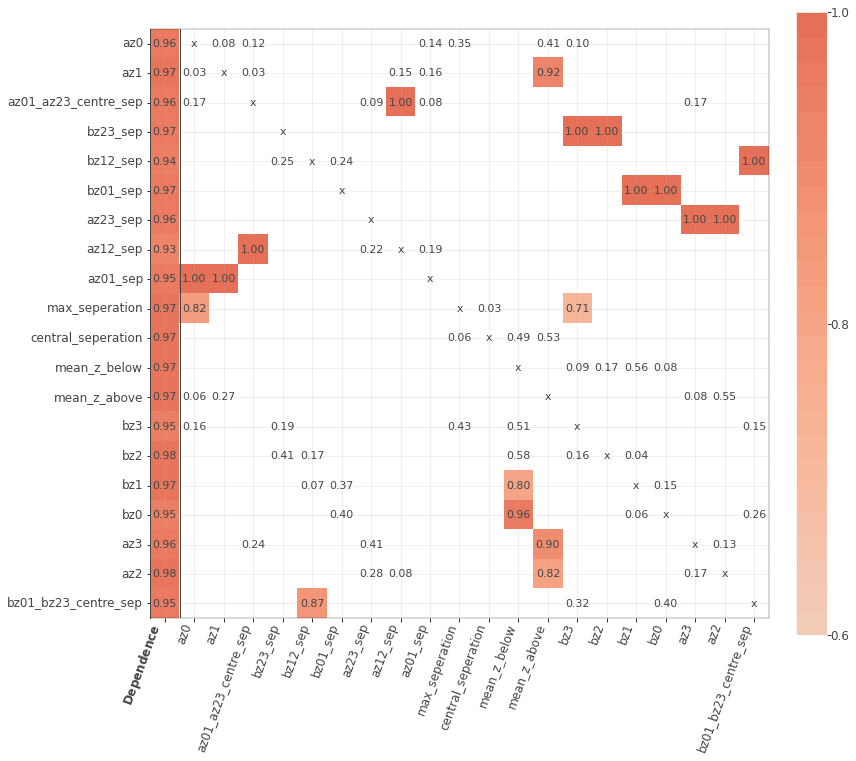


20 predictable features found to pass mutual dependence threshold of 0.8

Checking ['bz01_bz23_centre_sep', 'az2']
+----------------------+-------------+-------------+
|       Removed        |  OOB Score  |  Val Score  |
+----------------------+-------------+-------------+
|         None         | 0.409±0.004 | 0.877±0.002 |
| bz01_bz23_centre_sep |  0.41±0.004 | 0.877±0.002 |
|         az2          | 0.414±0.007 |  0.88±0.002 |
+----------------------+-------------+-------------+
Dropping az2

19 predictable features found to pass mutual dependence threshold of 0.8

Checking ['az3', 'bz0', 'bz1', 'bz2']
+---------+-------------+---------------+
| Removed |  OOB Score  |   Val Score   |
+---------+-------------+---------------+
|   None  | 0.402±0.005 |  0.875±0.002  |
|   az3   |   0.4±0.01  | 0.8762±0.0006 |
|   bz0   |  0.4±0.008  |  0.877±0.002  |
|   bz1   | 0.394±0.005 |  0.876±0.001  |
|   bz2   | 0.412±0.007 |  0.877±0.001  |
+---------+-------------+---------------+
Dropping 

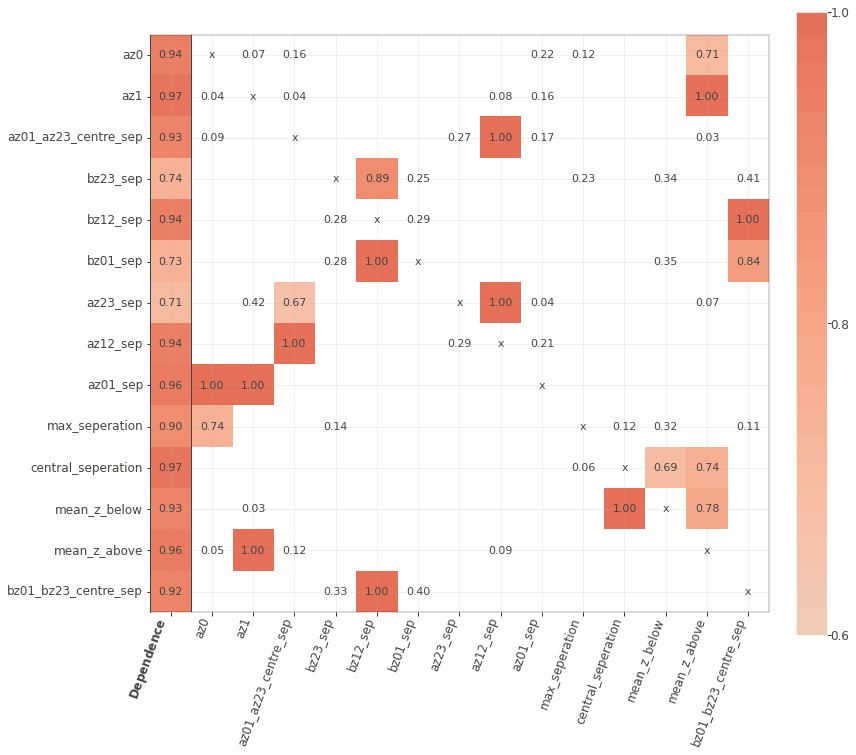


11 predictable features found to pass mutual dependence threshold of 0.8
Comparing RF scores, higher = better
All features:		0.877±0.003
Filtered features:	0.872±0.004

Filtering took 50.985 seconds


In [127]:
from lumin.optimisation.features import auto_filter_on_mutual_dependence

filtered_feats = auto_filter_on_mutual_dependence(train_df=df, val_df=df,
                                                  check_feats=import_feats,
                                                  objective='regression', targ_name='auc',
                                                  rf_params=rf_params,
                                                  optimise_rf=False)

In [128]:
rf_params, rf = get_opt_rf_params(x_trn=df[filtered_feats], y_trn=df['auc'],
                                 x_val=df[filtered_feats], y_val=df['auc'],
                                 objective='regression',
                                 n_estimators=100, verbose=False,
                                 params=OrderedDict({'min_samples_leaf': [2,4,8,16,32],
                                                     'max_features': [0.3,0.5,0.7,0.9]}))

In [115]:
from lumin.plotting.interpretation import plot_1d_partial_dependence, plot_2d_partial_dependence

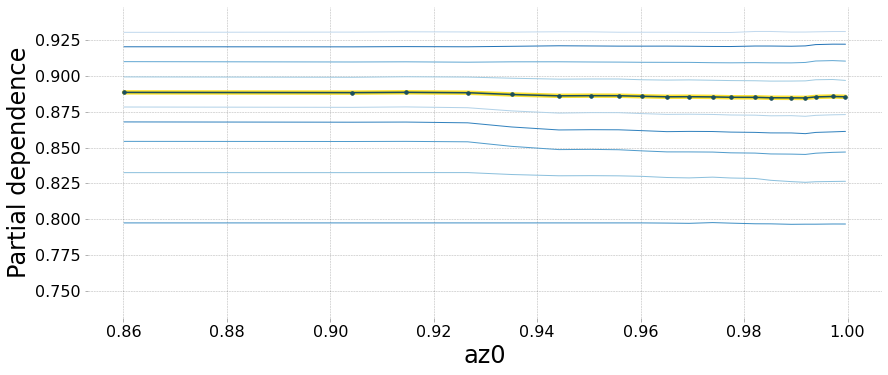

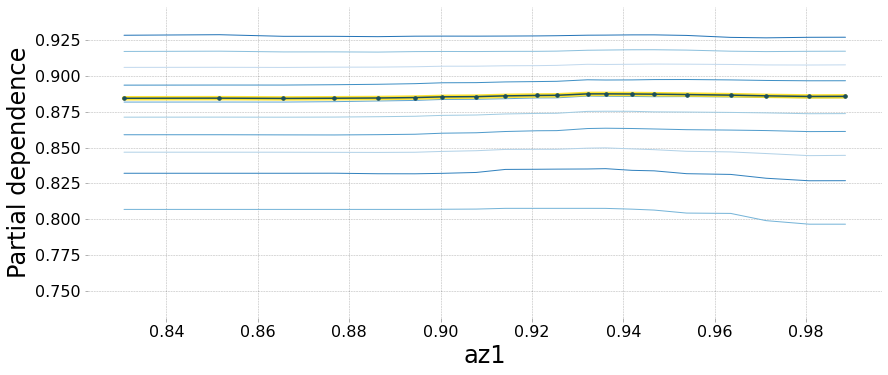

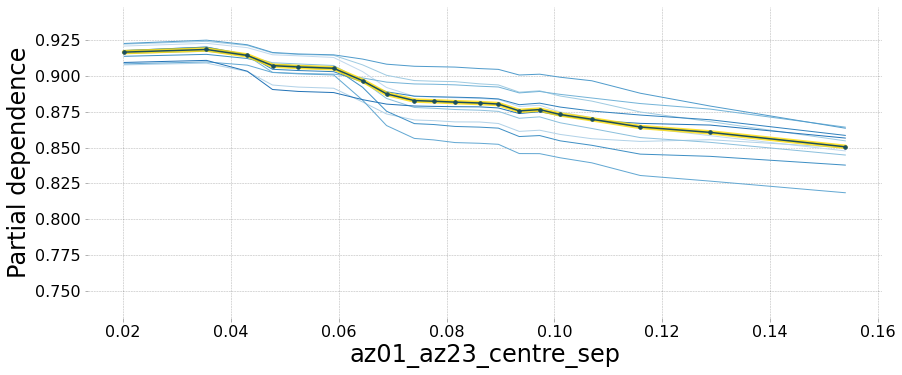

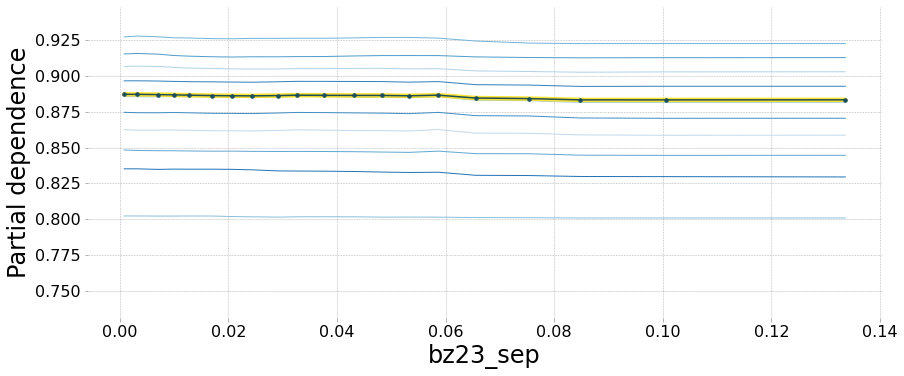

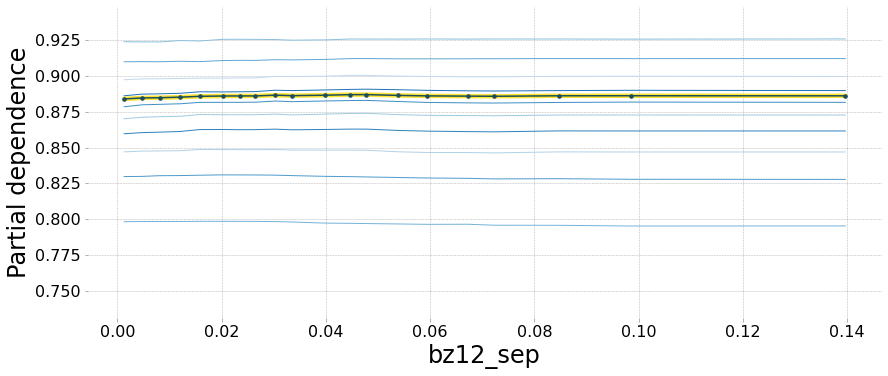

...

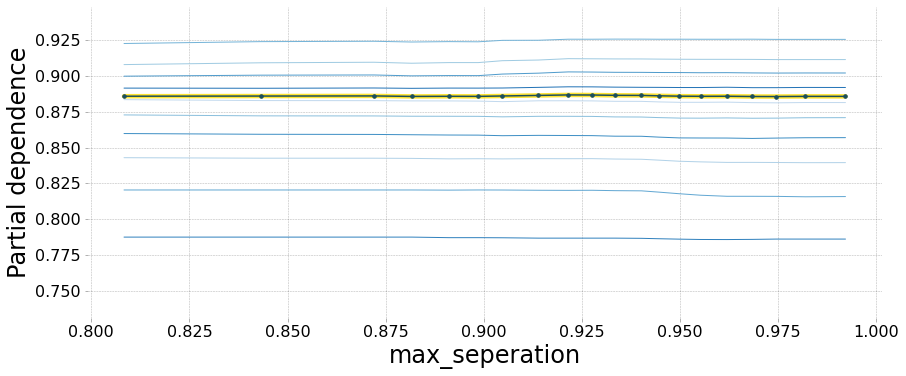

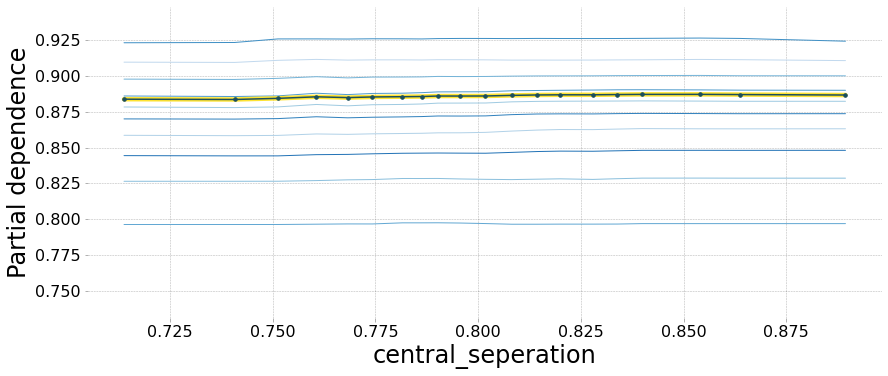

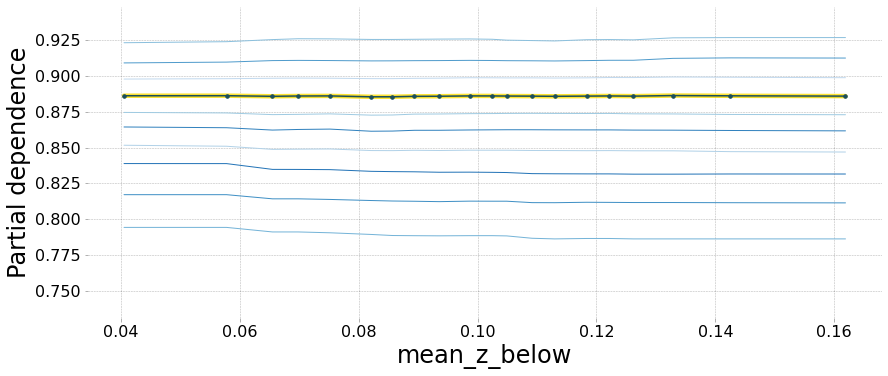

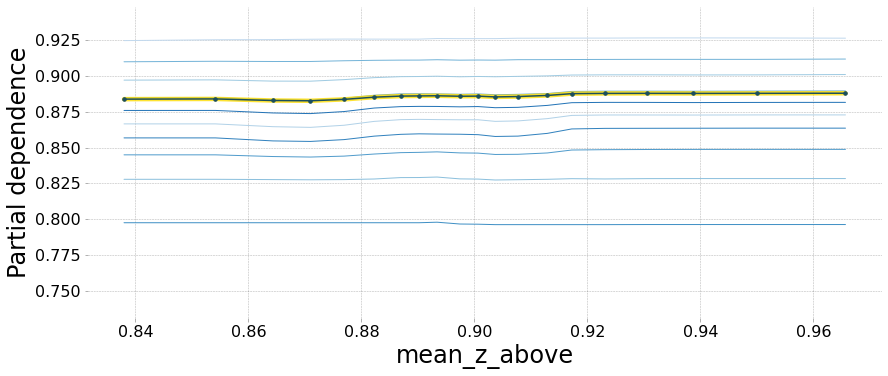

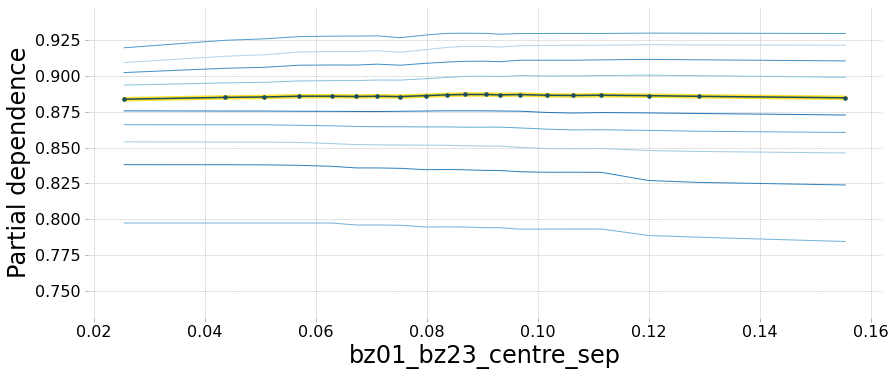

In [129]:
for f in filtered_feats:
    plot_1d_partial_dependence(rf, df=df, feat=f, train_feats=filtered_feats, pdp_isolate_kargs={'percentile_range':(1,99)}, y_lim=(df.auc.min(), df.auc.max()))